In [1]:
import numpy as np
import cv2 as cv
import cv2
from imageio import imread
import matplotlib.pyplot as plt
import copy


# 1

In [2]:
def show_img(img, title='', gray=False):
    plt.figure(figsize=(45,30))
    plt.title(title)
    if gray:
        plt.imshow(img, cmap=('gray'), vmin=0, vmax=255)
    else:
        plt.imshow(img)
    plt.axis('off')
    plt.show()

path = '6-images/'
imgs = [cv2.resize(cv.imread(path + f'{i}.png')[...,::-1], (0,0), fx=0.5, fy=0.5) for i in range(1,7)]

/home/konstaku/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:58: RuntimeWarning: overflow encountered in ubyte_scalars


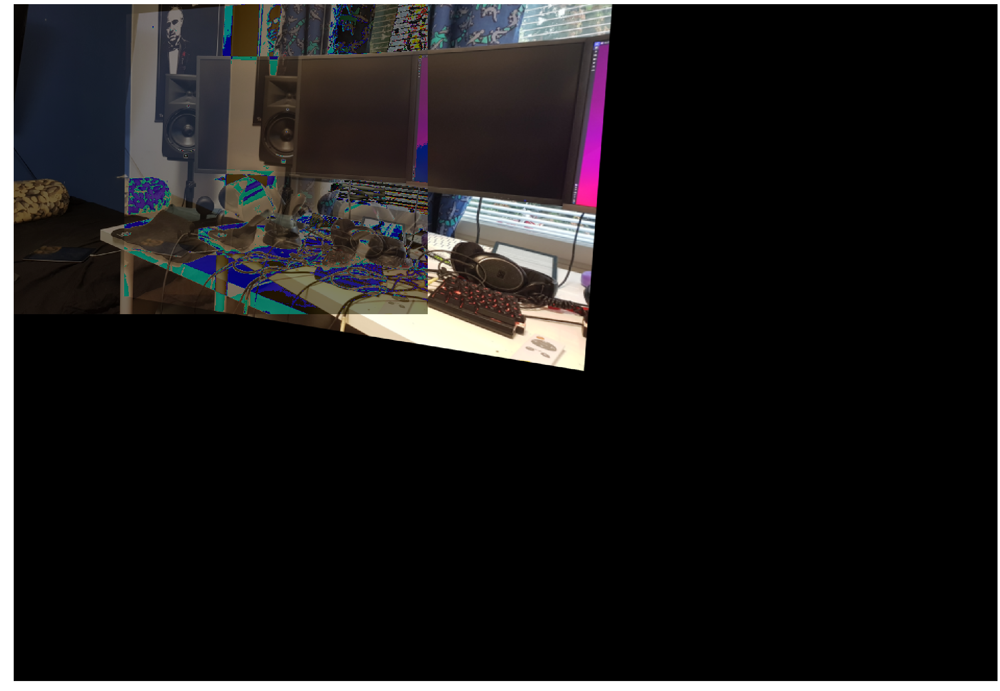

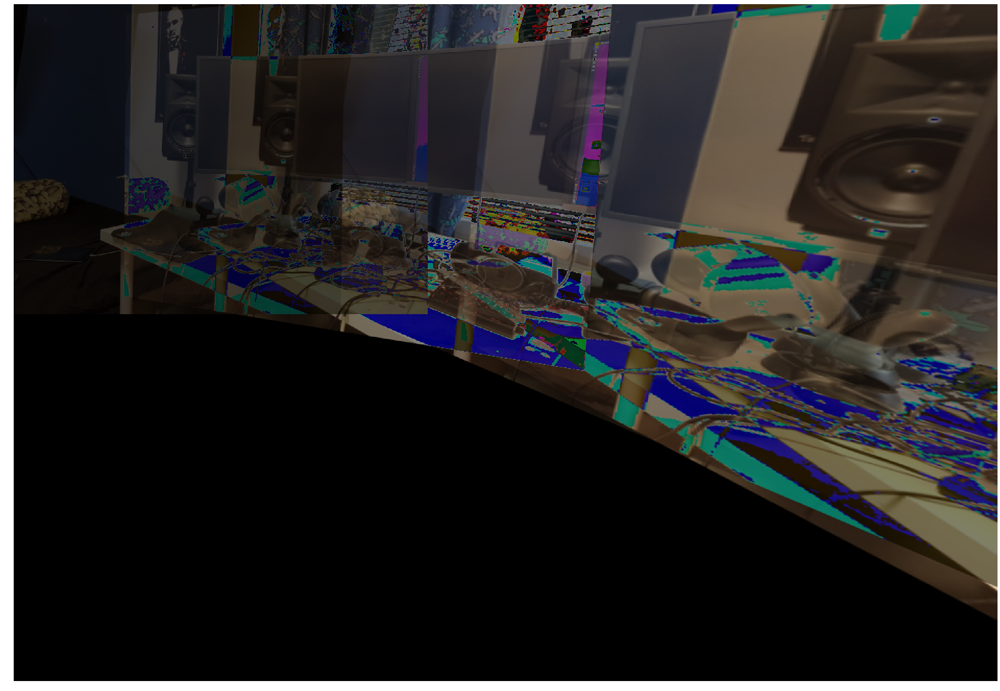

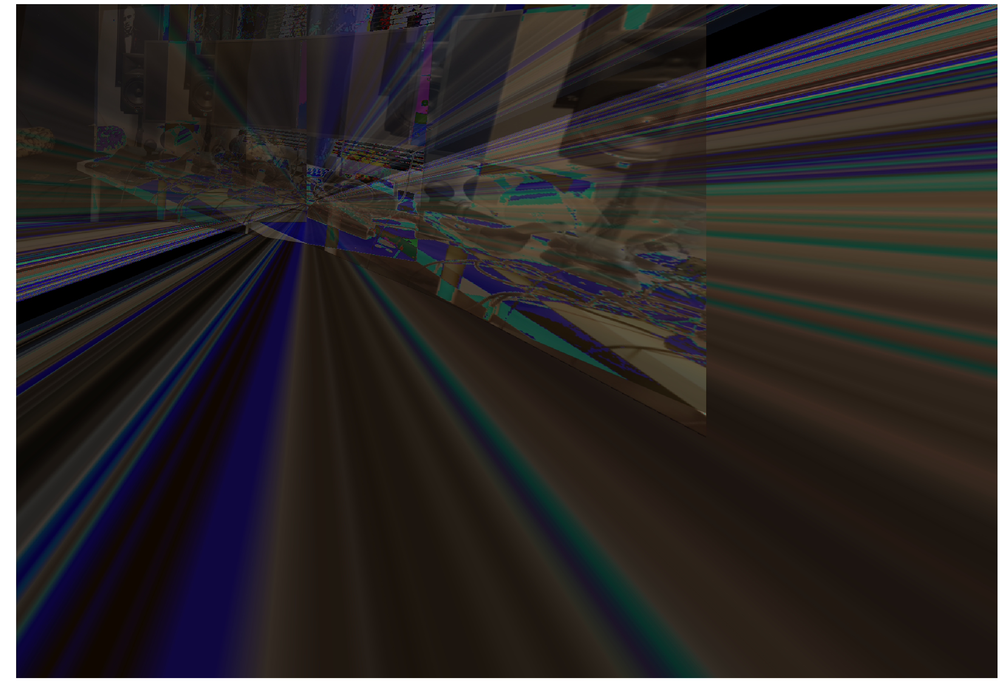

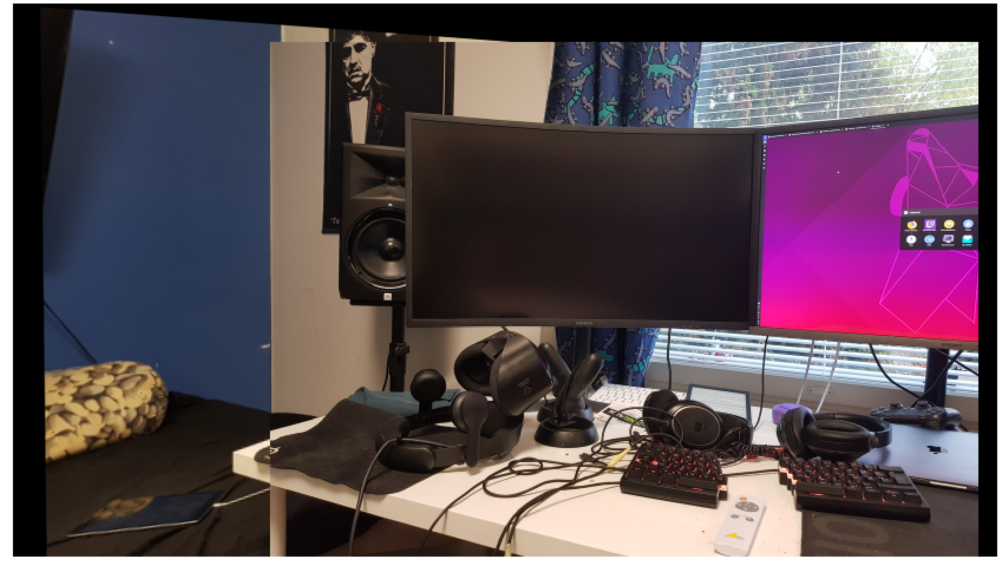

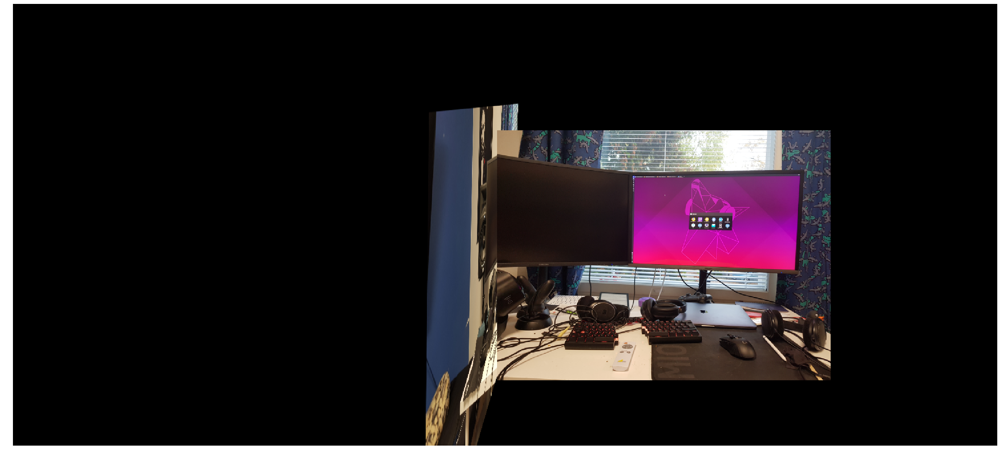

In [11]:
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm=0, trees=5)
index_params= dict(algorithm = 0, table_number = 6, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
orb = cv.ORB_create()
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)

def match(img1, img2):
    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)


    matches = bf.match(des1, des2)
    matches = sorted(matches, key = lambda x:x.distance)[:18]
#     matches = flann.knnMatch(des2, des1, k=2)
#     matches = [(m.trainIdx, m.queryIdx) for (m, n) in matches if m.distance < 0.7 * n.distance]

    first_points = np.float32([kp1[m.queryIdx].pt for m in matches])
    second_points = np.float32([kp2[m.trainIdx].pt for m in matches])
    

    M, mask = cv.findHomography(second_points, first_points, cv.RANSAC, 4)
    
#     matchesMask = mask.ravel().tolist()

#     h, w, d = img1.shape
#     pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
#     dst = cv.perspectiveTransform(pts, M)

#     img2 = cv.polylines(img2,[np.int32(dst)],True,255,3, cv.LINE_AA)

#     draw_params = dict(matchColor = (0,255,0),
#                        singlePointColor = None,
#                        matchesMask = matchesMask,
#                        flags = 2)

#     img3 = cv.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
#     show_img(img3.get())
    
    return M

def join_images(left, right):
    ly, lx = left.shape[:2]
    ry, rx = right.shape[:2]
    
    for i in range(0, rx):
        for j in range(0, ry):
            try:
                if(np.array_equal(left[j,i],np.array([0,0,0])) and  np.array_equal(right[j,i],np.array([0,0,0]))):
                    right[j,i] = [0, 0, 0]
                else:
                    if not (np.array_equal(left[j,i],np.array([0,0,0])) and not np.array_equal(right[j,i],np.array([0,0,0]))):
                                                    
#                             if not np.array_equal(right[j,i], [0,0,0]):
                        br, gr, rr = right[j,i]
                        bl,gl,rl = left[j,i]
                        right[j, i] = [(bl + br) // 2,(gl + gr) // 2,(rl + rr) // 2]
#                             else:
                    elif(np.array_equal(right[j,i],[0,0,0])):
                        right[j,i] = leftImage[j,i]
                    else:
                        if not np.array_equal(left[j,i], [0,0,0]):
                            bw, gw, rw = right[j,i]
                            bl,gl,rl = left[j,i]
                            right[j, i] = left[j,i]
            except:
                pass
            
    return right
    

def panorama(imgs):
    center = len(imgs) // 2 - 1
    left = imgs[:center+1]
    right = imgs[center + 1:]
    
    curr = imgs[0]
    
    
    for img in imgs[1:4]:
        h = match(curr, img)
        trans = h @ np.array((curr.shape[1], curr.shape[0], 1))
        trans = trans / trans[-1]
        dsize = (int(trans[0] + curr.shape[1]), int(trans[1]) + curr.shape[0])
        tmp = cv2.warpPerspective(curr, h, dsize)
        
        curr = join_images(curr, tmp)
        show_img(curr)

    curr = imgs[0]
    
    for img in imgs[1:3]:
        h = match(curr, img)
        h_inv = np.linalg.inv(h)
        
        f = h_inv @ np.array([0,0,1])
        f = f / f[-1]
        
        h_inv[0][-1] += abs(f[0])
        h_inv[1][-1] += abs(f[1])
        
        d = h_inv @ np.array((curr.shape[1], curr.shape[0], 1))
        d = d / d[-1]
        
        x_offset = abs(int(f[0]))
        y_offset = abs(int(f[1]))
        
        size = (int(d[0]) + x_offset, int(d[1]) + y_offset)
        
        
        tmp = cv.warpPerspective(curr, h_inv, size)
        shape = tmp[y_offset : img.shape[0]+y_offset, x_offset:img.shape[1]+x_offset].shape
        tmp[y_offset : img.shape[0]+y_offset, x_offset:img.shape[1]+x_offset] = img[:shape[0], :shape[1]]
        show_img(tmp)

    
    
# match(imgs[0], imgs[1])
panorama(imgs)

The image stitching almost does something correct. For some reason it seems to be drawing the same image over and over again and I am not sure why it is happening. I was trying to match the same indices for the keypoints for the longest time so I didn't really get to work on the actual image stitching so it is quite incomplete still. I think the image locations look quite ok when creating the panorama but it is drawing the same image over and over again so maybe there is some bug in the image creation or something. I wanted to create a stitching from the center image to the left and to the right to get proper alignment but here we just go one way. Also I think the coordinates should be remapped to another plane but this implementation is still ways away from that.

# 2

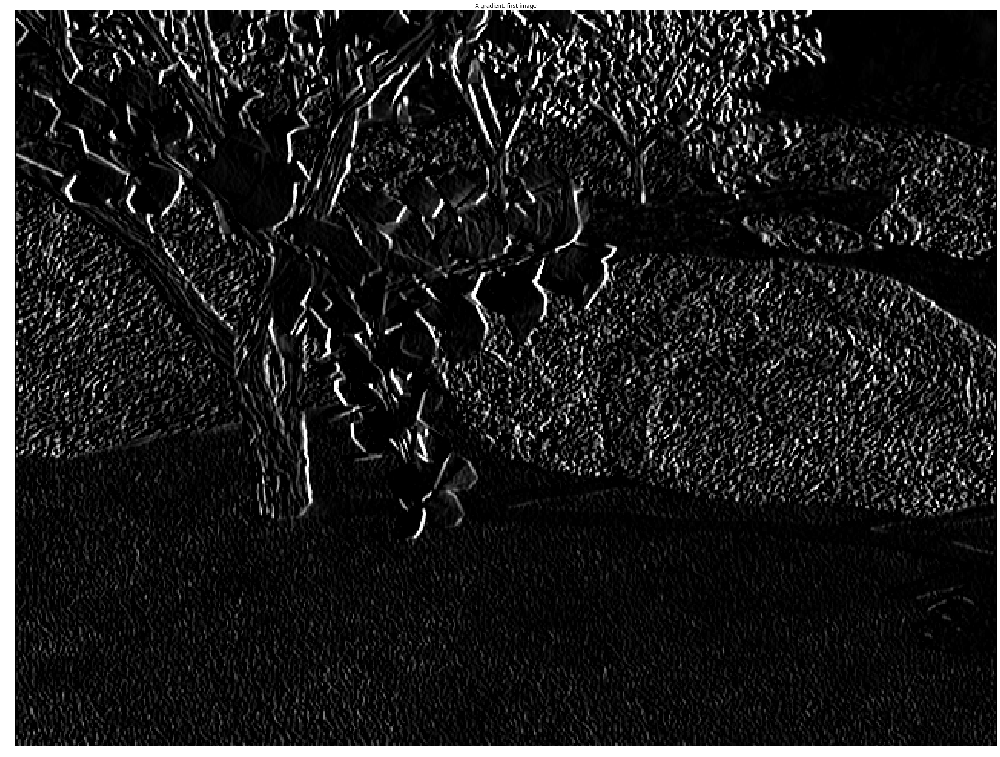

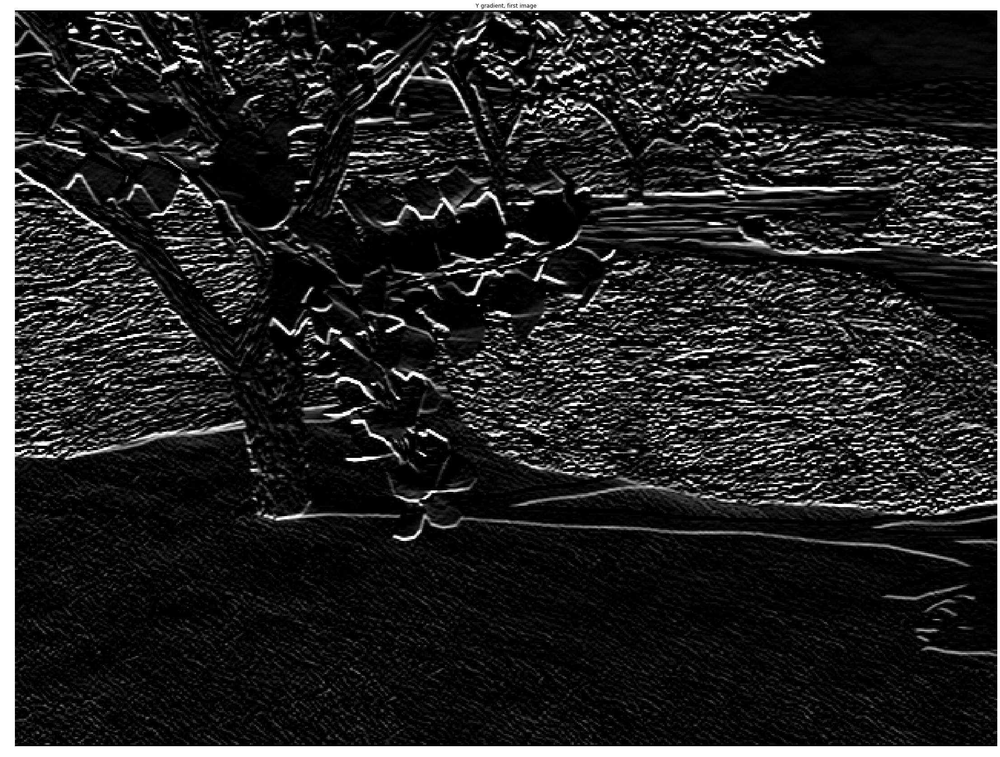

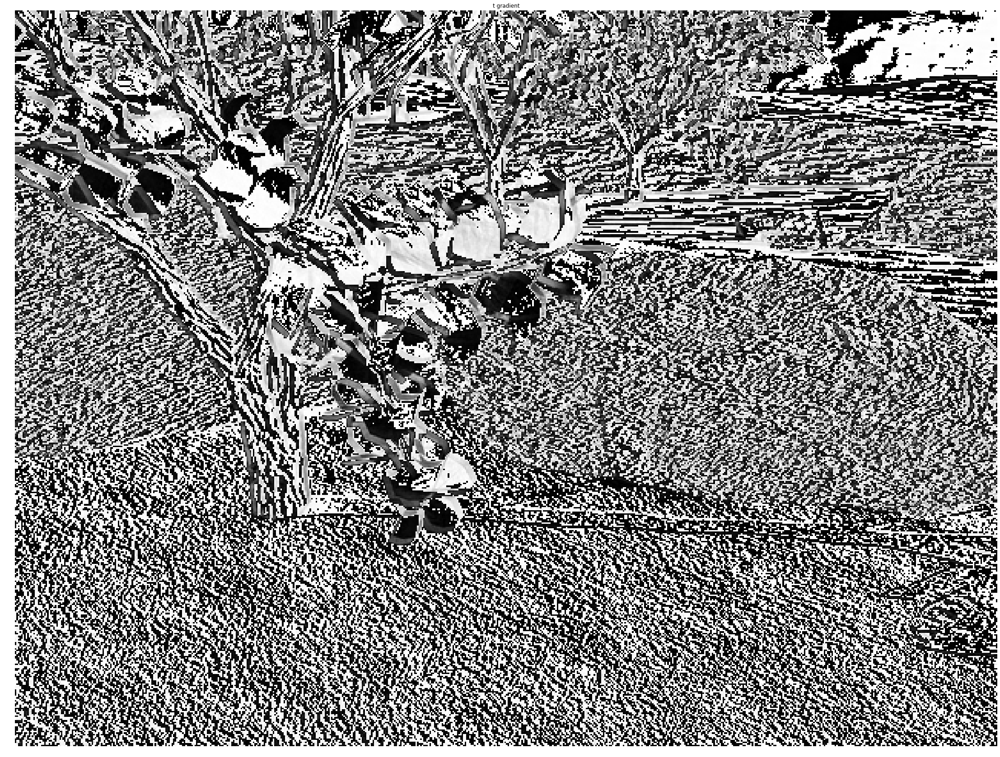

In [4]:


f1 = cv.cvtColor(imread('5-frame1.png'), cv.COLOR_RGB2GRAY)
f2 = cv.cvtColor(imread('5-frame2.png'), cv.COLOR_RGB2GRAY)

test = imread('Bikesgray.jpg')

x_filter = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
])

y_filter = np.array([
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]
])

t_filter = np.array([
    [1,1,1],
    [1,1,1],
    [1,1,1]
]) * 1/9

dx1 = cv.filter2D(f1, -1, x_filter)
dy1 = cv.filter2D(f1, -1, y_filter)
dx2 = cv.filter2D(f2, -1, x_filter)
dy2 = cv.filter2D(f2, -1, y_filter)
dt = cv.filter2D(f1, -1, t_filter) - cv.filter2D(f2, -1, t_filter)
dt = f1 - f2

show_img(dx1, 'X gradient, first image', True)
# show_img(dx2, 'X gradient, second image', True)
show_img(dy1, 'Y gradient, first image', True)
# show_img(dy2, 'Y gradient, second image', True)
show_img(dt, 't gradient', True)

(480, 640, 3) (480, 640, 3)


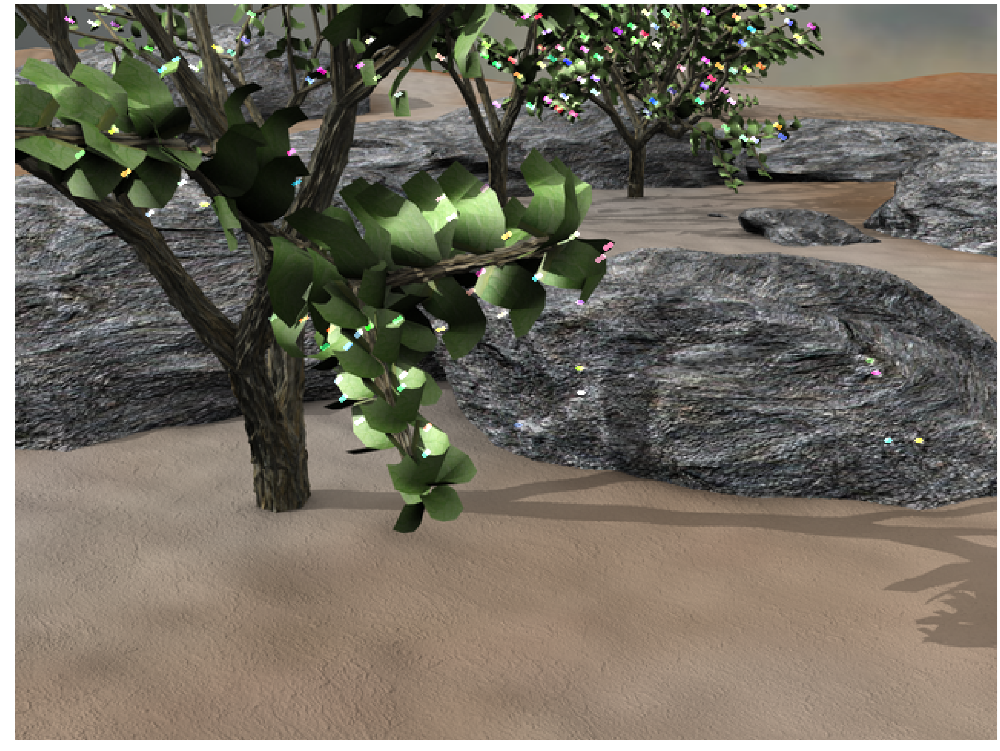

In [5]:

frame = imread('5-frame1.png')
mask = np.zeros_like(frame)
f1_feats = cv.goodFeaturesToTrack(f1, mask = None, maxCorners = 5000, qualityLevel= 0.3, minDistance = 7, blockSize = 7)
f2_feats, st, err = cv.calcOpticalFlowPyrLK(f1, f2, f1_feats, None)

color = np.random.randint(0,255,(5000,3))

new_feats = f2_feats[st==1]
old_feats = f1_feats[st==1]

for i,(new,old) in enumerate(zip(new_feats, old_feats)):
    a,b = new.ravel()
    c,d = old.ravel()
    mask = cv.line(mask, (a,b),(c,d), color[i].tolist(), 2)
#     frame = cv.circle(frame,(a,b),5,color[i].tolist(),-1)

print(frame.shape, mask.shape)
img = cv.add(frame, mask)
show_img(img)


In [6]:
from itertools import combinations

def luke_in_canada(i1, i2, w=2):
    dx = cv.filter2D(i1, -1, x_filter)
    dy = cv.filter2D(i1, -1, y_filter)
    dt = i1 - i2
    
    
    res = np.zeros((dx.shape[0], dx.shape[1], 2))
    
    for y in range(w,dx.shape[0] - w):
        for x in range(w,dx.shape[1] - w):
            A = np.stack([dx[y - w: y + w + 1, x - w: x + w + 1].flatten(), dy[y - w: y + w + 1, x - w: x + w + 1].flatten()]).T
            b = dt[y - w: y + w + 1, x - w: x + w + 1].flatten()
            try:
                res[y, x] = np.clip(np.linalg.inv(A.T @ A) @ A.T @ b, -1000, 1000)
            except:
                pass

    return res

    
luke = luke_in_canada(f1, f2)    
# luke = luke_in_canada(cv.cvtColor(imread('4-image-second.jpg'), cv.COLOR_RGB2GRAY), cv.cvtColor(imread('4-image.jpg'), cv.COLOR_RGB2GRAY))
    

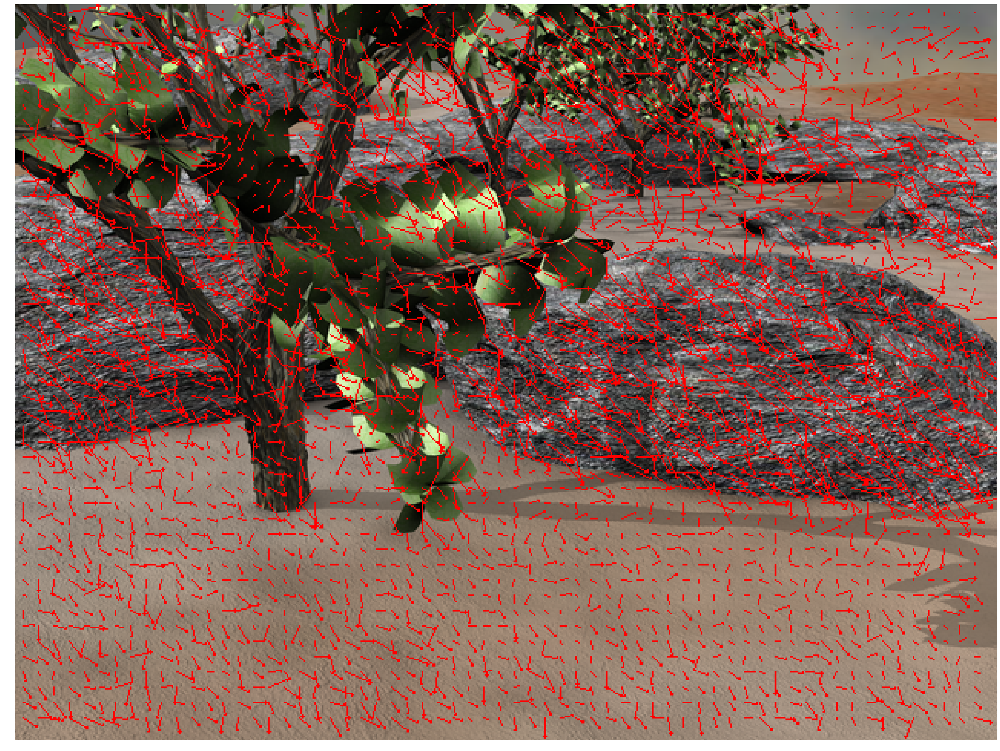

In [38]:
from copy import deepcopy 

conv_f = np.array([[1/ 100] * 5] * 5)
use_the_filter_luke = cv.filter2D(luke, -1, conv_f)
use_the_filter_luke = use_the_filter_luke  * .15
# use_the_filter_luke = use_the_filter_luke  * 30
img = imread('5-frame1.png')
i2 = imread('5-frame2.png')

# img = cv.addWeighted(img, 0.2, i2, 0.1, 0)

for i in range(5, len(f1) - 6, 10):
    for j in range(5, len(f1[0]) - 6, 10):
        x, y = np.clip(use_the_filter_luke[i, j] , -20, 20)
        try:
            cv.arrowedLine(img, (j, i), (int(j + x), int(i + y)),  (255, 0, ))
        except:
            pass
        
show_img(img)